<h1 style="text-align: center;">
<div style="color:grey; font-size: 0.6em;">Jakub Ostrzołek</div>
<div>WMM lab. 5 - właściwości obrazów</div>
</h1>

## Przygotowanie
### Przygotowanie bibliotek i ścieżek do plików
Numer przydzielonego mi obrazka to:

$$310864 \; mod \; 36 = 4$$

, zatem będę pracował na obrazach o nazwie `boat2_*.png`

![boat2_col.png](obrazy/color/boat2_col.png)

![boat2_mono.png](obrazy/monochrome/boat2_mono.png)

In [16]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt

from pathlib import Path

data_dir = Path("./obrazy")
img_name = "boat2"
img_paths = {key: str(path) for key, path in {
    "color"        : data_dir / "color"         / f"{img_name}_col.png"       ,
    "color_inoise1": data_dir / "color_inoise1" / f"{img_name}_col_inoise.png",
    "color_inoise2": data_dir / "color_inoise2" / f"{img_name}_col_inoise.png",
    "color_noise"  : data_dir / "color_noise"   / f"{img_name}_col_noise.png" ,
    "monochrome"   : data_dir / "monochrome"    / f"{img_name}_mono.png" ,
}.items()}

out_dir_root = Path("./out")
out_dir_root.mkdir()

### Przygotowanie funkcji pomocniczych
Przed wyświetleniem obrazka w `matplotlib` trzeba go przekonwertować na przestrzeń kolorów domyślnie wspieraną przez tę     bibliotekę - RGB zamiast BGR. 

Dodatkowo dla bitmap ze znakiem zmieniany jest zasięg wartości wyświetlanych pikseli (teoretycznie dla typu int16 zakres powinien być dużo większy niż (-255, 255), ale tylko z takiego korzystamy w dalszych zadaniach)

In [17]:
def imshow(img: np.ndarray, img_title: str = "image",
           out_dir: str | Path = None, out_name: str = None):
    """Pomocnicza funkcja do wyświetlania i zapisywania obrazów"""
    plt.figure(figsize=(15, 10))
    plt.title(img_title)

    vmin=0
    vmax=255

    if (img.dtype == np.float32) or (img.dtype == np.float64):
        img_ = img / 255
    elif img.dtype == np.int16:
        vmin = -255
        vmax = 255
        img_ = img
    else:
        img_ = img

    # konwersja na przestrzeń RGB wspieraną przez matplotlib
    if (len(img_.shape) == 3):
        img_ = cv2.cvtColor(img_, cv2.COLOR_BGR2RGB)
    # bez skalowania wartości pikseli
    plt.imshow(img_, cmap="gray", vmin=vmin, vmax=vmax)
    plt.xticks([]), plt.yticks([])

    if out_dir is not None:
        out_dir = Path(out_dir)
        out_dir.mkdir(parents=True, exist_ok=True)
        if out_name is None:
            out_filename = out_dir / f"{img_title}.png"
        else:
            out_filename = out_dir / out_name
        cv2.imwrite(str(out_filename), img)

    plt.show()
    plt.close()


def printi(img, img_title="image"):
    """ Pomocnicza funkcja do wypisania informacji o obrazie. """
    print(f"{img_title}, wymiary: {img.shape}, typ danych: {img.dtype}, wartości: {img.min()} - {img.max()}")


# Obraz monochromatyczny
## Obliczanie przepływności bitowej

In [18]:
image = cv2.imread(img_paths["monochrome"], cv2.IMREAD_UNCHANGED)
printi(image, "image")

bitrate = 8 * os.stat(img_paths["monochrome"]).st_size / (image.shape[0] * image.shape[1])
print(f"bitrate: {bitrate:.4f}")


image, wymiary: (512, 768), typ danych: uint8, wartości: 1 - 255
bitrate: 5.0293


## Obliczanie entropii obrazu

In [6]:
def calc_entropy(hist):
    # normalizacja histogramu -> rozkład prawdopodobieństwa; UWAGA:
    # niebezpieczeństwo '/0' dla 'zerowego' histogramu!!!
    pdf = hist / hist.sum()
    # entropy = -(pdf*np.log2(pdf)).sum() ### zapis na tablicach, ale problem
    # z '/0'
    entropy = -sum([x * np.log2(x) for x in pdf if x != 0])
    return entropy

hist_image = cv2.calcHist([image], [0], None, [256], [0, 256]).flatten()

H_image = calc_entropy(hist_image)
print(f"H(image) = {H_image:.4f}")


H(image) = 6.8484


> Czy przepływność mniejsza od entropii oznacza, że zależność: $l_{śr} \ge H$ jest nieprawdziwa?

Nie, w formacie png obraz jest kopresowany (bezstratnie), przez co ma mniejszą entropię od surowej bitmapy. Natomiast powyższa wartość dotyczy właśnie takiej surowej bitmapy.

## Obraz różnicowy

### Wyznaczenie obrazu różnicowego

image_hdiff, wymiary: (512, 767), typ danych: int16, wartości: -203 - 175
image_hdiff_0, wymiary: (512, 1), typ danych: int16, wartości: -28 - -28
image_hdiff, wymiary: (512, 768), typ danych: int16, wartości: -203 - 175


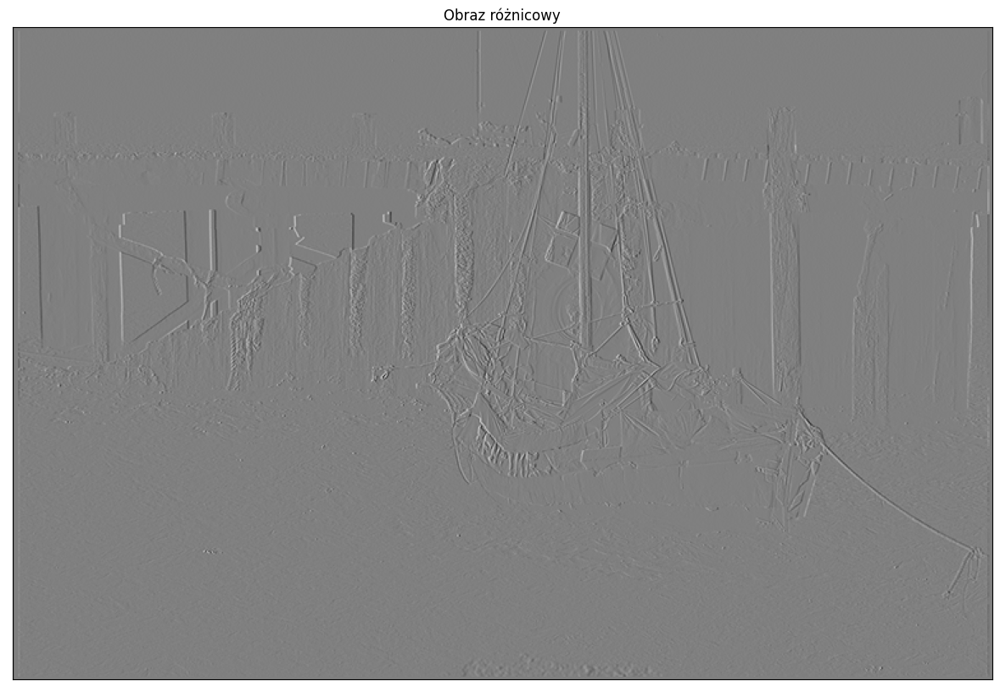

In [7]:

img_tmp1 = image[:, 1:]
img_tmp2 = image[:, :-1]

image_hdiff = cv2.addWeighted(img_tmp1, 1, img_tmp2, -1, 0, dtype=cv2.CV_16S)
printi(image_hdiff, "image_hdiff")

image_hdiff_0 = cv2.addWeighted(
    image[:, 0], 1, 0, 0, -127, dtype=cv2.CV_16S)
printi(image_hdiff_0, "image_hdiff_0")

image_hdiff = np.hstack((image_hdiff_0, image_hdiff))
printi(image_hdiff, "image_hdiff")

imshow(image_hdiff, "Obraz różnicowy")


### Histogram obrazu różnicowego

H(hdiff) = 5.0033


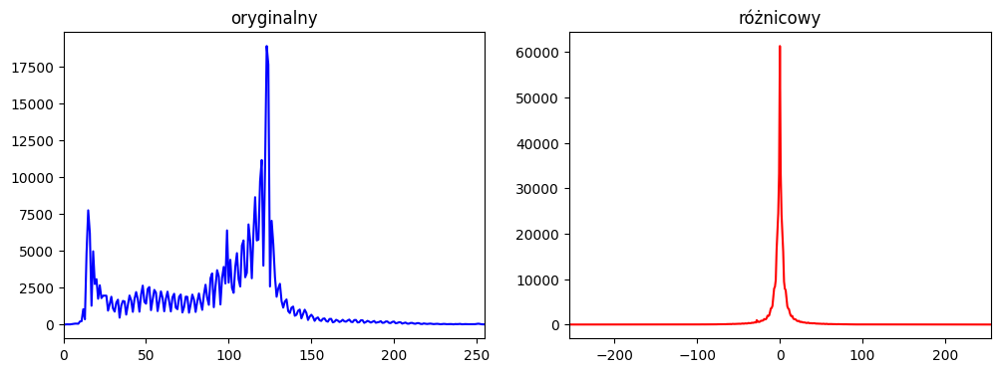

In [19]:

image_tmp = (image_hdiff + 255).astype(np.uint16)
hist_hdiff = cv2.calcHist([image_tmp], [0], None, [511], [0, 511]).flatten()

H_hdiff = calc_entropy(hist_hdiff)
print(f"H(hdiff) = {H_hdiff:.4f}")

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(hist_image, color="blue")
plt.title("oryginalny")
plt.xlim([0, 255])
plt.subplot(1, 2, 2)
plt.plot(np.arange(-255, 256, 1), hist_hdiff, color="red")
plt.title("różnicowy")
plt.xlim([-255, 255])
plt.show()


Jak można się było spodziewać, histogram obrazu różnicowego jest znacznie bardziej skupiony (wokół 0) i przyjmuje wartości z mniejszego zakresu. Dzięki temu można go zapisać na mniejszej liczbie bitów, a więc i entropia jest mniejsza (chociaż dalej większa niż przepływność bitowa obrazu PNG).

## Transformacja DWT
### Funkcja transformacji DWT

In [21]:
def dwt(img):

    maskL = np.array([0.02674875741080976, -0.01686411844287795, -0.07822326652898785, 0.2668641184428723,
                      0.6029490182363579, 0.2668641184428723, -0.07822326652898785, -0.01686411844287795, 
                      0.02674875741080976])
    maskH = np.array([0.09127176311424948, -0.05754352622849957, -0.5912717631142470, 1.115087052456994,
                      -0.5912717631142470, -0.05754352622849957, 0.09127176311424948])

    bandLL = cv2.sepFilter2D(img, -1, maskL, maskL)[::2, ::2]
    bandLH = cv2.sepFilter2D(img, cv2.CV_16S, maskL, maskH)[::2, ::2]
    bandHL = cv2.sepFilter2D(img, cv2.CV_16S, maskH, maskL)[::2, ::2]
    bandHH = cv2.sepFilter2D(img, cv2.CV_16S, maskH, maskH)[::2, ::2]

    return bandLL, bandLH, bandHL, bandHH


### Zastosowanie transformacji DWT

LL, wymiary: (256, 384), typ danych: uint8, wartości: 0 - 255
LH, wymiary: (256, 384), typ danych: int16, wartości: -137 - 129
HL, wymiary: (256, 384), typ danych: int16, wartości: -158 - 140
HH, wymiary: (256, 384), typ danych: int16, wartości: -218 - 192


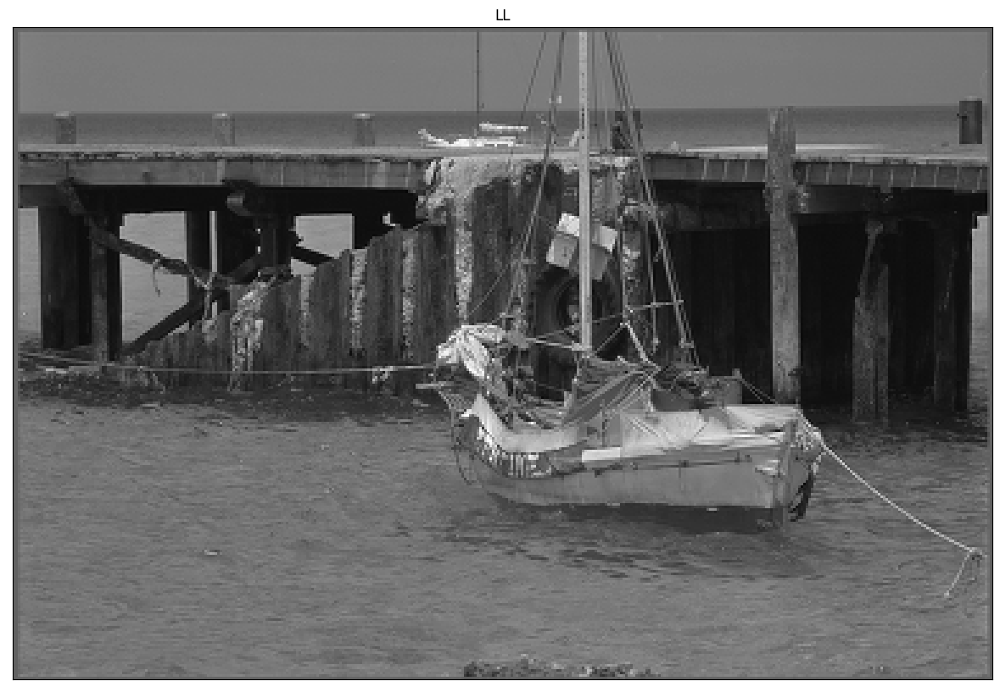

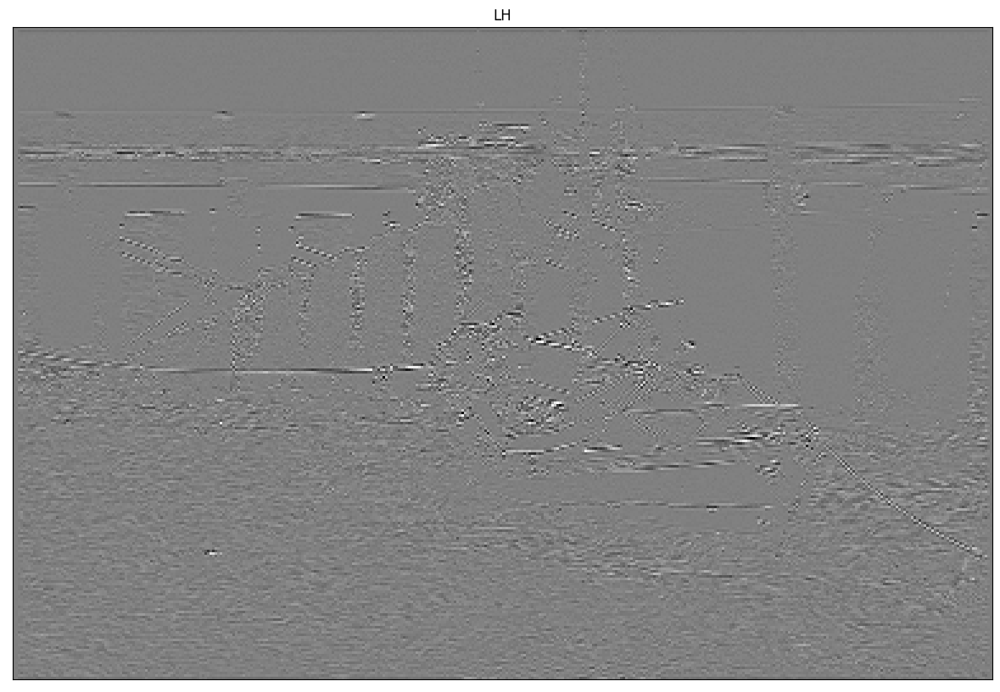

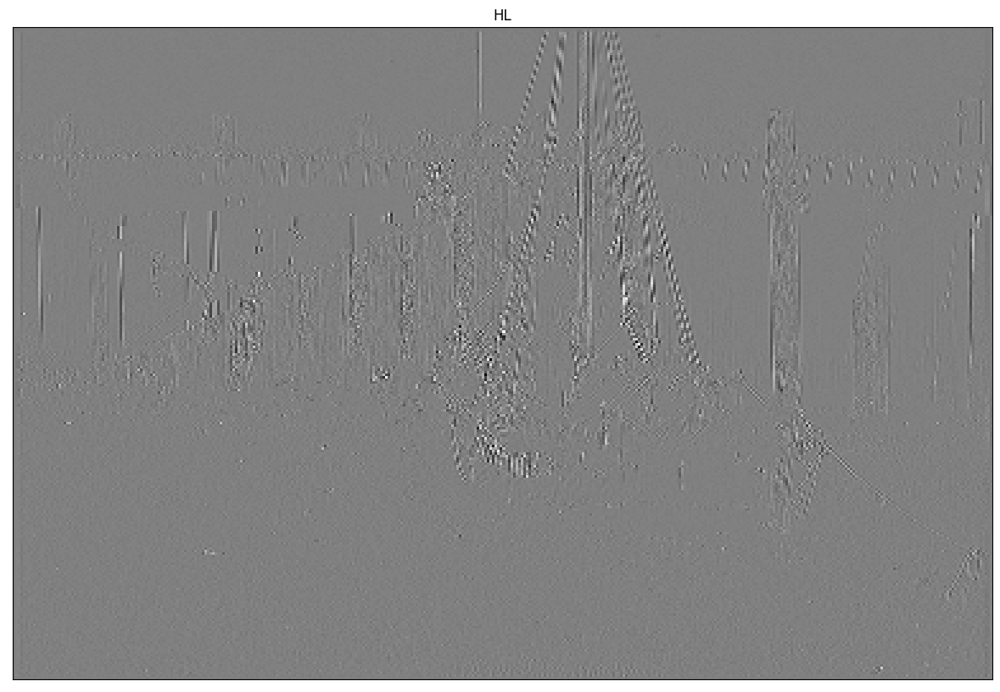

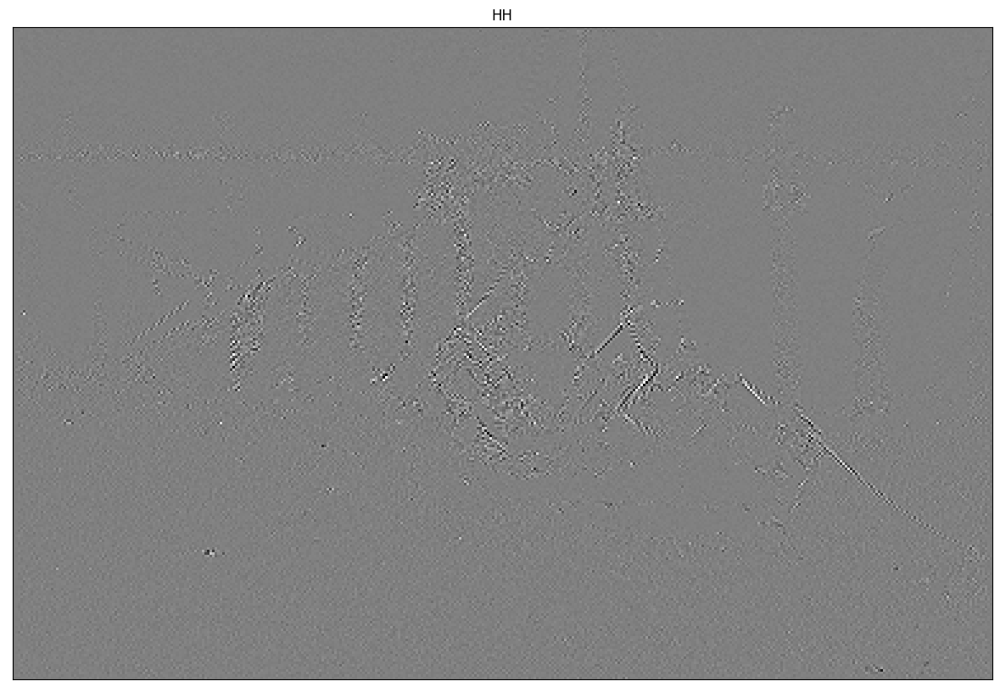

In [10]:
ll, lh, hl, hh = dwt(image)
printi(ll, "LL")
printi(lh, "LH")
printi(hl, "HL")
printi(hh, "HH")

imshow(ll, "LL")
imshow(cv2.multiply(lh, 2), "LH")
imshow(cv2.multiply(hl, 2), "HL")
imshow(cv2.multiply(hh, 2), "HH")


### Histogramy obrazu przetransformowanego

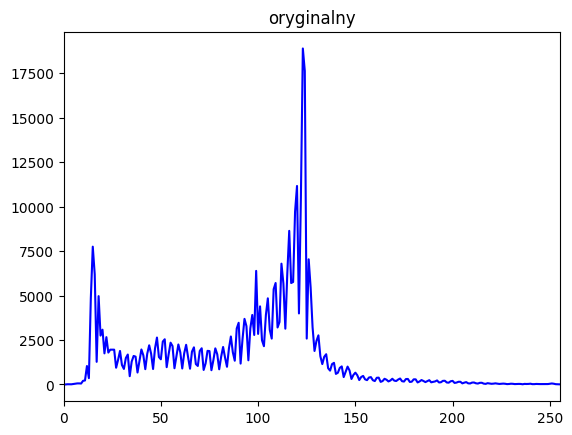

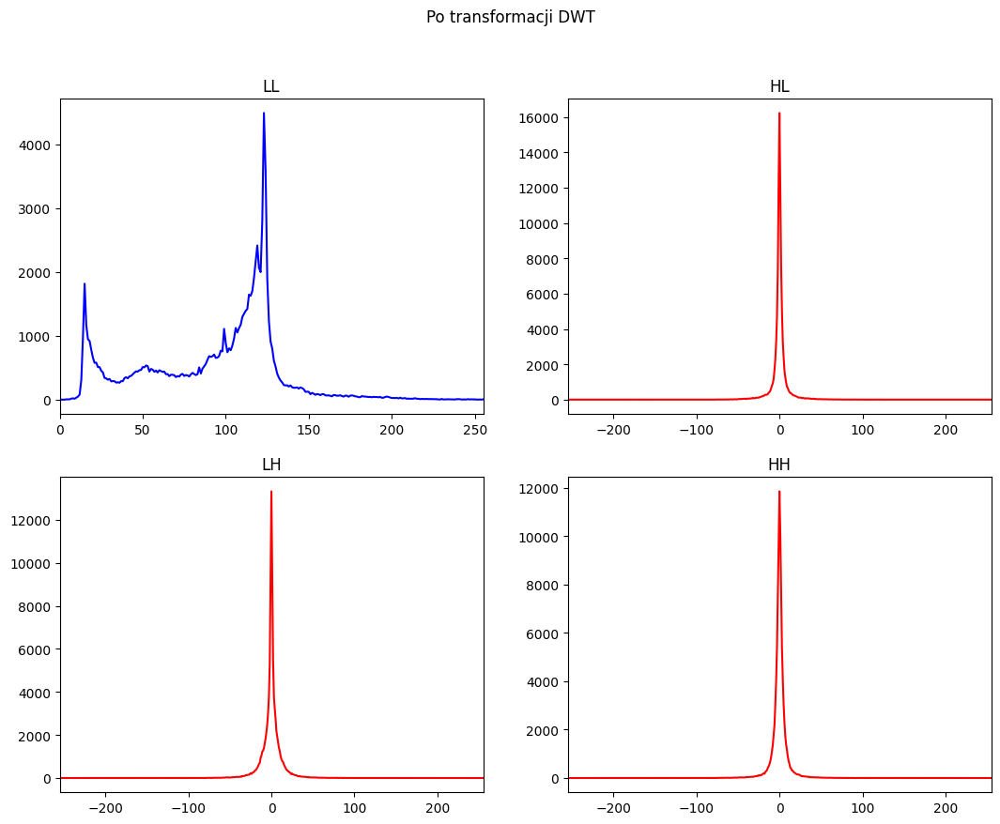

: 

In [22]:

hist_ll = cv2.calcHist([ll], [0], None, [256], [0, 256]).flatten()
hist_lh = cv2.calcHist([(lh + 255).astype(np.uint16)], [0], None, [511], [0, 511]).flatten()
hist_hl = cv2.calcHist([(hl + 255).astype(np.uint16)], [0], None, [511], [0, 511]).flatten()
hist_hh = cv2.calcHist([(hh + 255).astype(np.uint16)], [0], None, [511], [0, 511]).flatten()

plt.plot(hist_image, color="blue")
plt.title("oryginalny")
plt.xlim([0, 255])
plt.show()

fig = plt.figure()
fig.set_figheight(fig.get_figheight() * 2)  # zwiększenie rozmiarów okna
fig.set_figwidth(fig.get_figwidth() * 2)
plt.subplot(2, 2, 1)
plt.plot(hist_ll, color="blue")
plt.title("LL")
plt.xlim([0, 255])
plt.subplot(2, 2, 3)
plt.plot(np.arange(-255, 256, 1), hist_lh, color="red")
plt.title("LH")
plt.xlim([-255, 255])
plt.subplot(2, 2, 2)
plt.plot(np.arange(-255, 256, 1), hist_hl, color="red")
plt.title("HL")
plt.xlim([-255, 255])
plt.subplot(2, 2, 4)
plt.plot(np.arange(-255, 256, 1), hist_hh, color="red")
plt.title("HH")
plt.xlim([-255, 255])
plt.suptitle("Po transformacji DWT")
plt.show()


Wygładzony histogram obrazu oryginalnego jest przeskalowany w dół. Histogramy wysokoczęstotliwościowe podobne do histogramu różnicowego mają tak samo wysokie wartości skupione w 0. 
LL - to średnia jasność pikseli w danym miejscu, przez to jest podobny do histogram oryginalnego; 
LH, HL, HH - nakładane jako różnica na składową niskoczęstotliwościową, przez to są podobne do histogramu różnicowego.

### Entropia obrazu przetransformowanego

In [25]:
H_ll = calc_entropy(hist_ll)
H_lh = calc_entropy(hist_lh)
H_hl = calc_entropy(hist_hl)
H_hh = calc_entropy(hist_hh)
print(f"H(LL) = {H_ll:.4f} \n"
      f"H(LH) = {H_lh:.4f} \n"
      f"H(HL) = {H_hl:.4f} \n"
      f"H(HH) = {H_hh:.4f} \n"
      f"H_śr = {(H_ll+H_lh+H_hl+H_hh)/4:.4f}")


H(LL) = 7.3746 
H(LH) = 5.3553 
H(HL) = 5.2674 
H(HH) = 5.2771 
H_śr = 5.8186


Pasmo niskoczęstotliwościowe ma entropię zbliżoną do entropii obrazu oryginalnego. Natomiast entropie pasm wysokoczęstotliwościowych są dużo niższe, przez co średnia entropia złożenia pasm jest również dużo niższa od obrazu oryginalnego i zbliżona do przepływności bitowej obrazu w formacie PNG.

# Obraz barwny
## Entropia w przestrzeni RGB 

image_col, wymiary: (512, 768, 3), typ danych: uint8, wartości: 0 - 255
H(R) = 6.9182 
H(G) = 7.0234 
H(B) = 6.9199 
H_śr = 6.9538


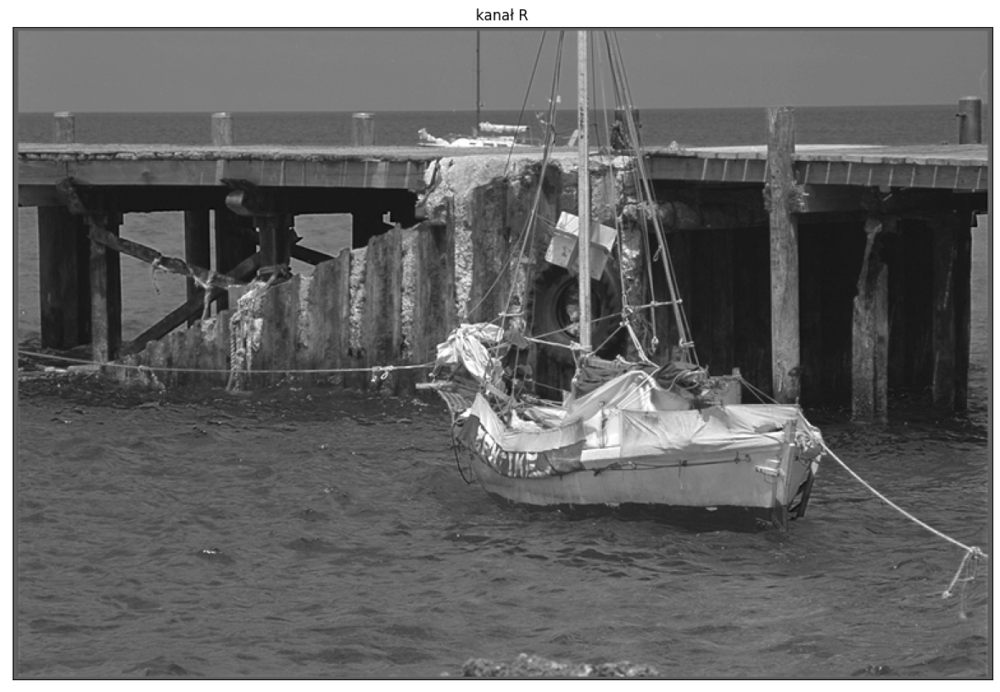

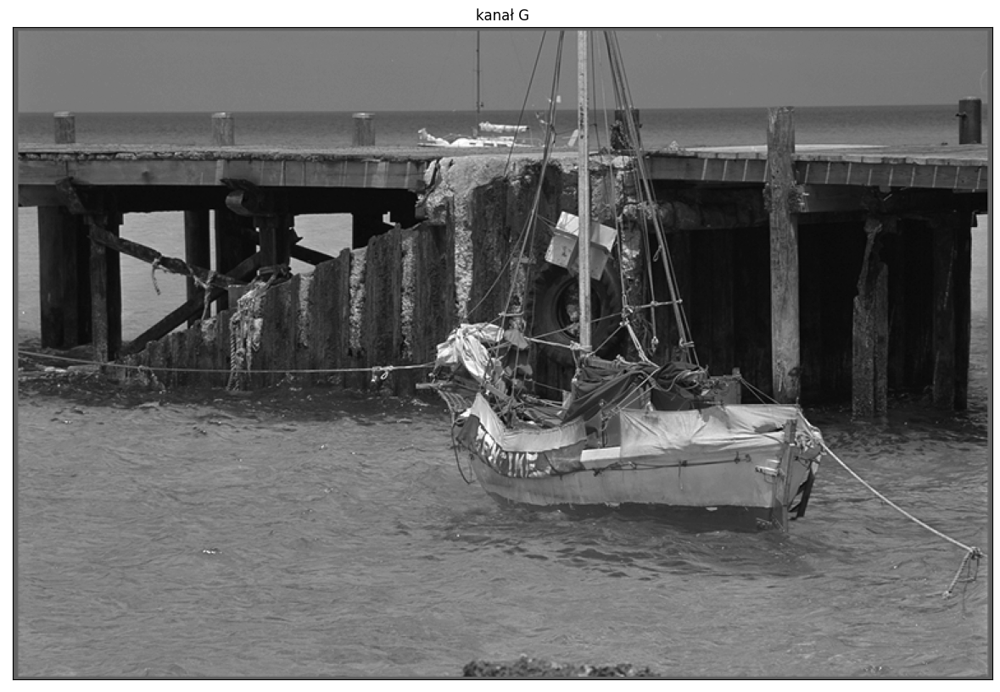

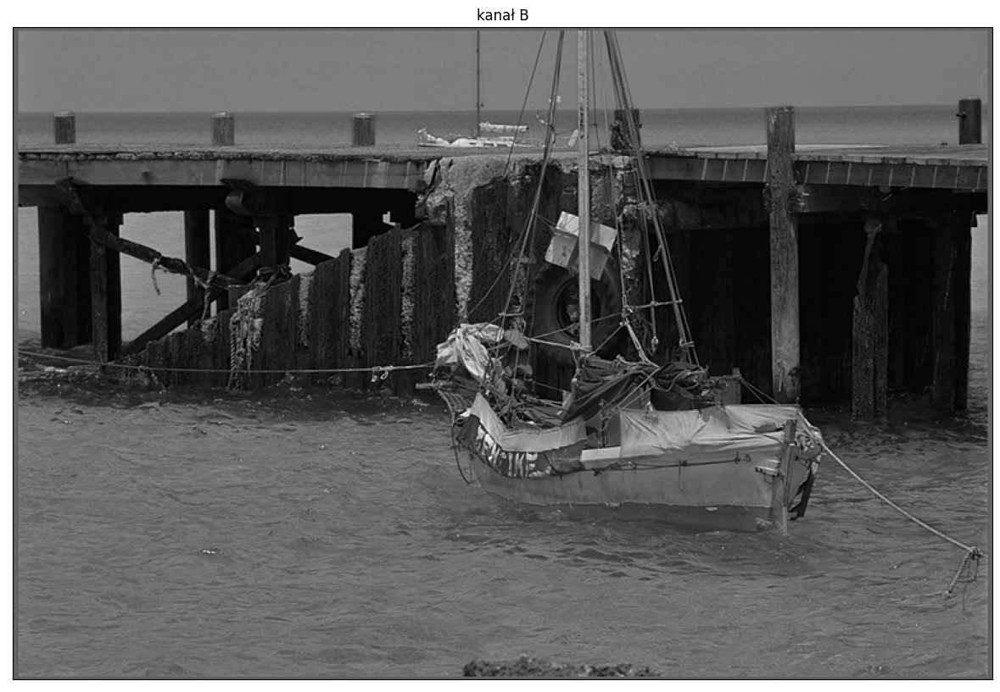

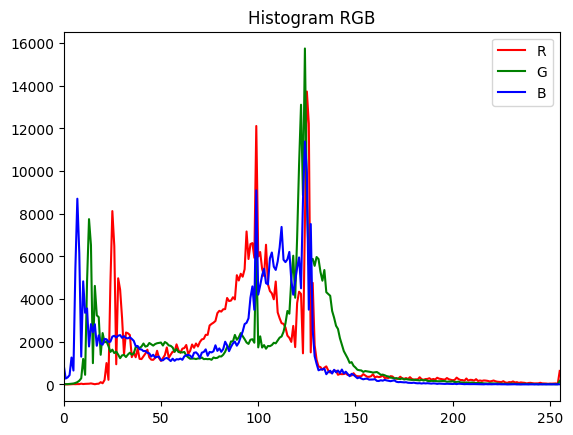

In [12]:

image_col = cv2.imread(img_paths["color"])
printi(image_col, "image_col")

image_R = image_col[:, :, 2]  # cv2.imread() zwraca obrazy w formacie BGR
image_G = image_col[:, :, 1]
image_B = image_col[:, :, 0]

hist_R = cv2.calcHist([image_R], [0], None, [256], [0, 256]).flatten()
hist_G = cv2.calcHist([image_G], [0], None, [256], [0, 256]).flatten()
hist_B = cv2.calcHist([image_B], [0], None, [256], [0, 256]).flatten()

H_R = calc_entropy(hist_R)
H_G = calc_entropy(hist_G)
H_B = calc_entropy(hist_B)
print(f"H(R) = {H_R:.4f} \n"
      f"H(G) = {H_G:.4f} \n"
      f"H(B) = {H_B:.4f} \n"
      f"H_śr = {(H_R+H_G+H_B)/3:.4f}")

imshow(image_R, "kanał R")
imshow(image_G, "kanał G")
imshow(image_B, "kanał B")
plt.figure()
plt.plot(hist_R, color="red", label="R")
plt.plot(hist_G, color="green", label="G")
plt.plot(hist_B, color="blue", label="B")
plt.title("Histogram RGB")
plt.legend()
plt.xlim([0, 255])
plt.show()


Zarówno histogramy jak i obrazy wszystkich kanałów wyglądają podobnie do siebie na wzajem oraz do wyników dla obrazu monochromatycznego.

## Konwersja do YCrCb

image_YCrCb, wymiary: (512, 768, 3), typ danych: uint8, wartości: 1 - 255
H(Y) = 6.8474 
H(Cr) = 5.1212 
H(Cb) = 4.4020 
H_śr = 5.4569


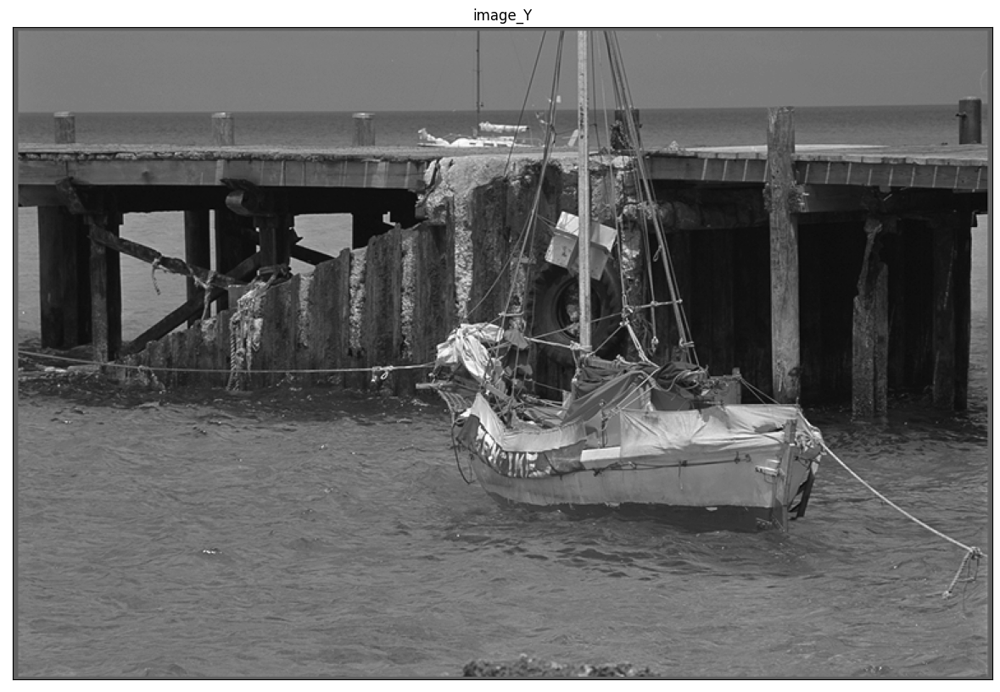

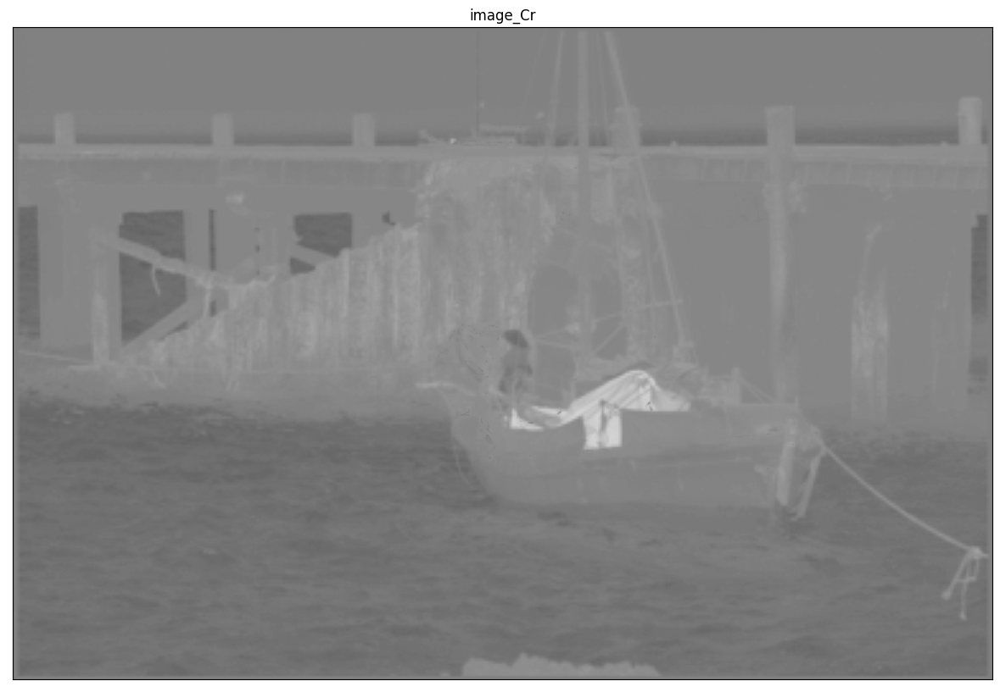

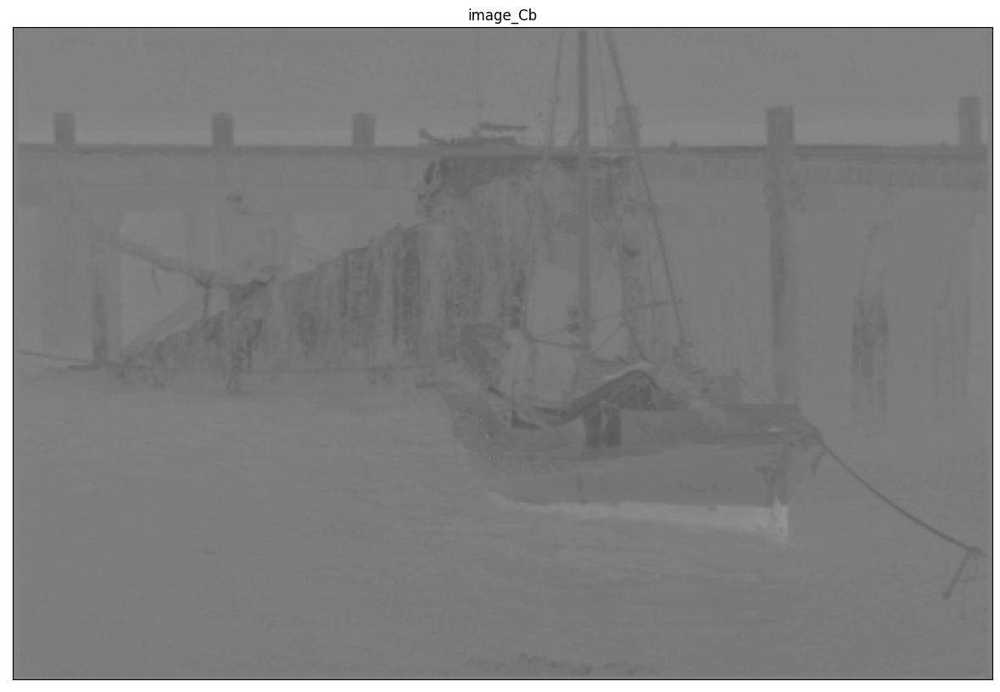

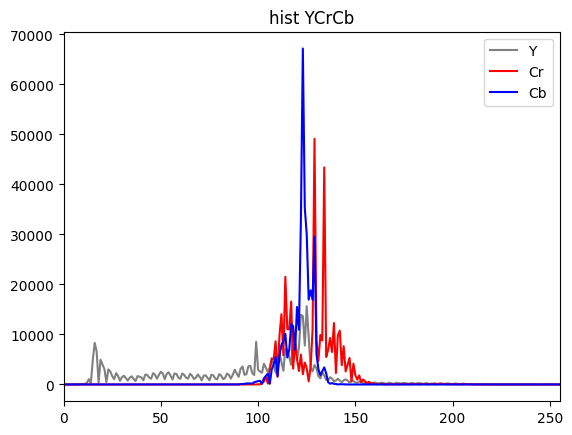

In [13]:

image_YCrCb = cv2.cvtColor(image_col, cv2.COLOR_BGR2YCrCb) 
printi(image_YCrCb, "image_YCrCb")

hist_Y = cv2.calcHist([image_YCrCb[:, :, 0]], [0], None, [256], [0, 256]).flatten()
hist_Cr = cv2.calcHist([image_YCrCb[:, :, 1]], [0], None, [256], [0, 256]).flatten()
hist_Cb = cv2.calcHist([image_YCrCb[:, :, 2]], [0], None, [256], [0, 256]).flatten()

H_Y = calc_entropy(hist_Y)
H_Cr = calc_entropy(hist_Cr)
H_Cb = calc_entropy(hist_Cb)
print(f"H(Y) = {H_Y:.4f} \nH(Cr) = {H_Cr:.4f} \nH(Cb) = {H_Cb:.4f} \nH_śr = {(H_Y+H_Cr+H_Cb)/3:.4f}")

imshow(image_YCrCb[:, :, 0], "image_Y")
imshow(image_YCrCb[:, :, 1], "image_Cr")
imshow(image_YCrCb[:, :, 2], "image_Cb")
plt.figure()
plt.plot(hist_Y, color="gray", label="Y")
plt.plot(hist_Cr, color="red", label="Cr")
plt.plot(hist_Cb, color="blue", label="Cb")
plt.title("hist YCrCb")
plt.xlim([0, 255])
plt.legend()
plt.show()


Obrazy pokazują, że kanały chrominancyjne mają mniejszą entropię niż kanał luminancyjny. 
Związane to z przestrzenią barw, bo kanał luminancyjny pokazuje jasność, przez to ma podobne wyniki do obrazów monochromatycznych.
Natomiast kanały chrominancyjne pokazują przesunięcie barwy w danym kierunku bez zmiany jasności, więc wyniki będą zbliżone do obrazów różnicowych.

## Zależność zniekształcenia od przepływności
### Obliczenie miar jakości

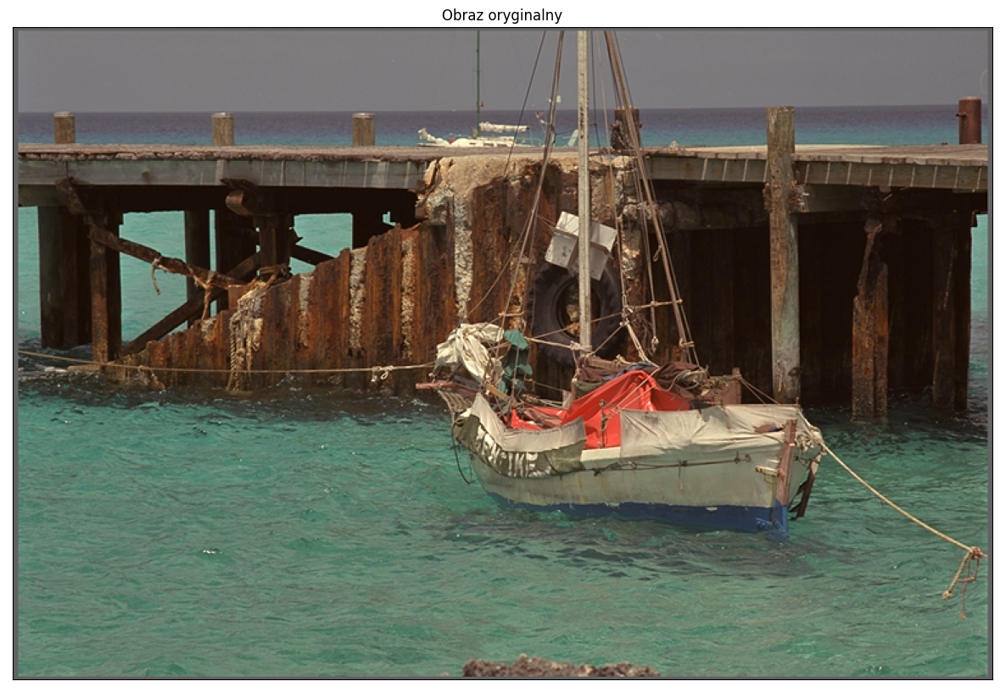

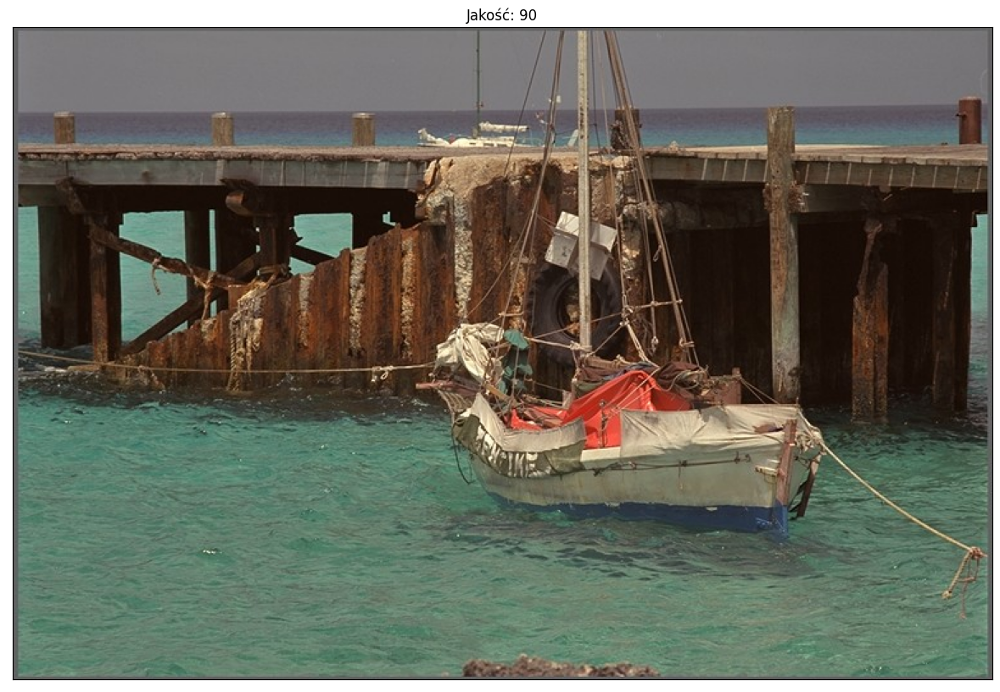

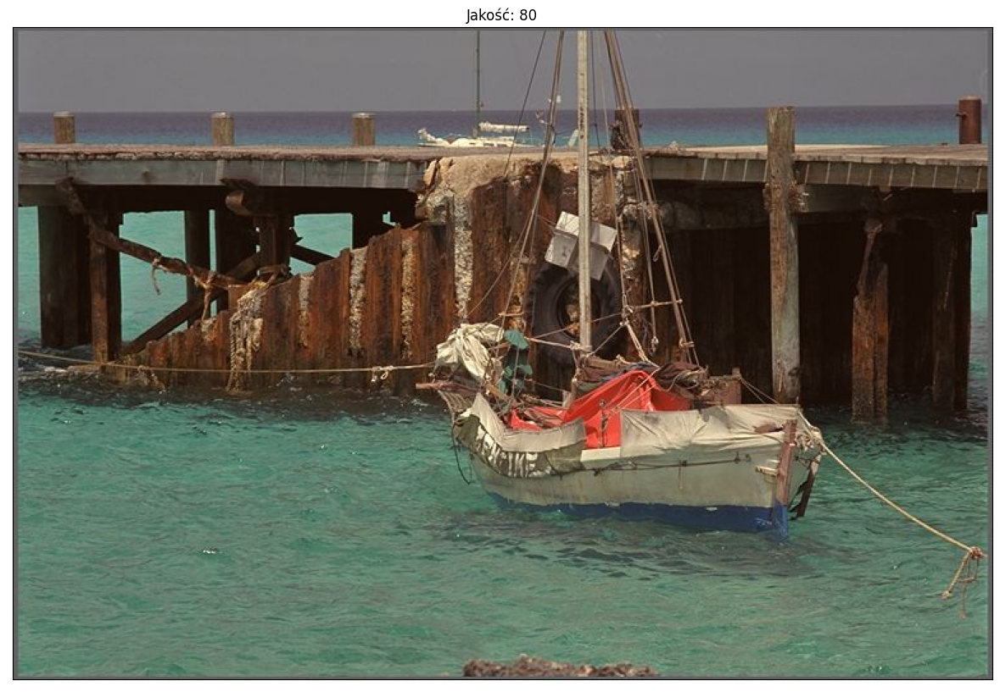

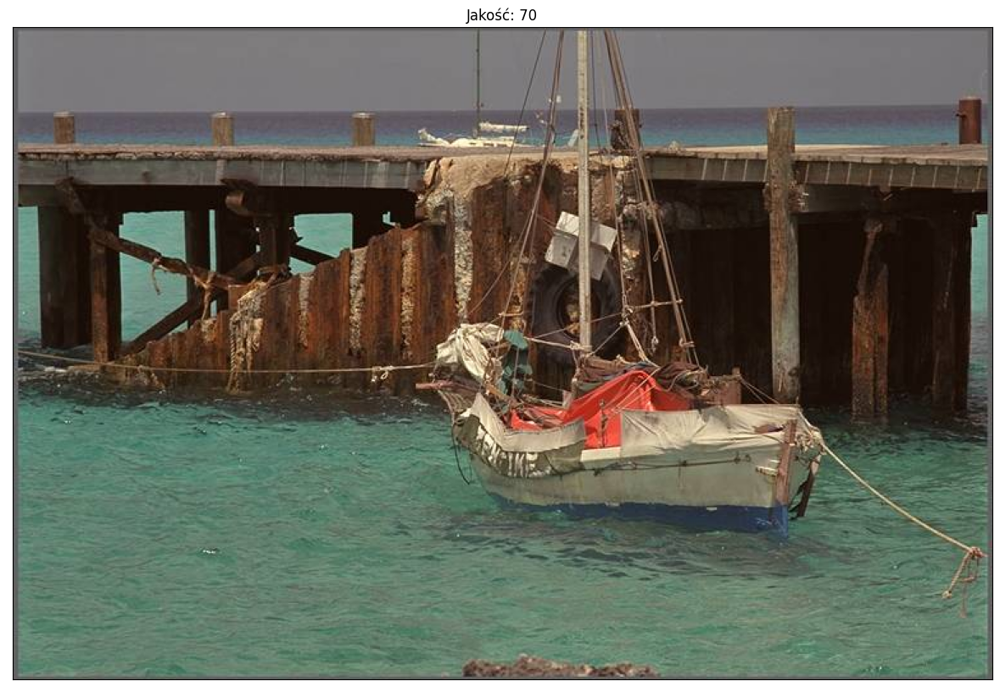

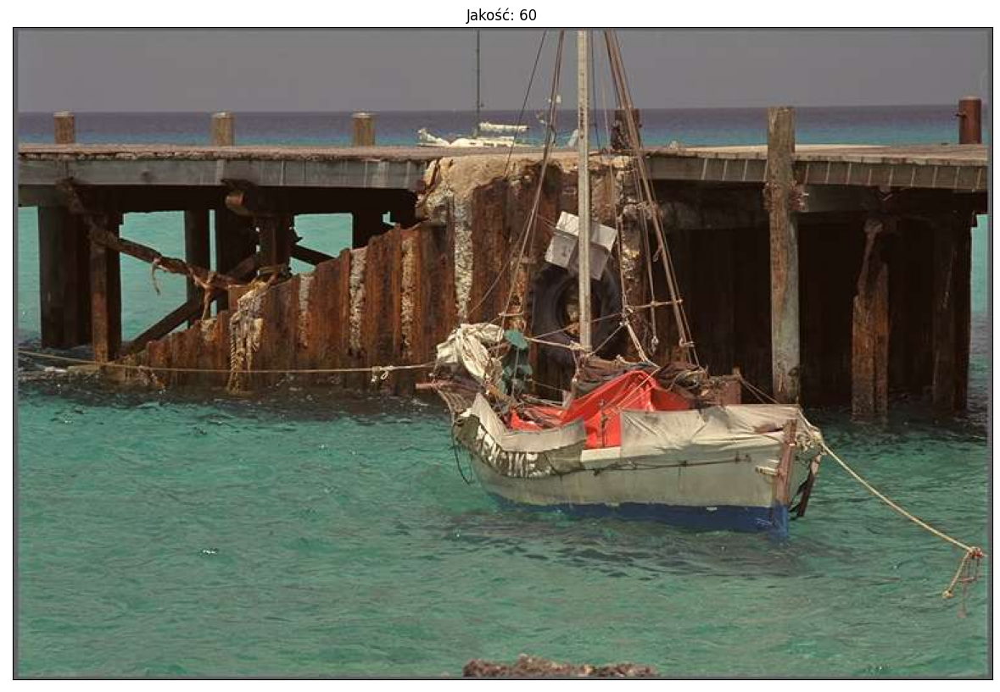

...

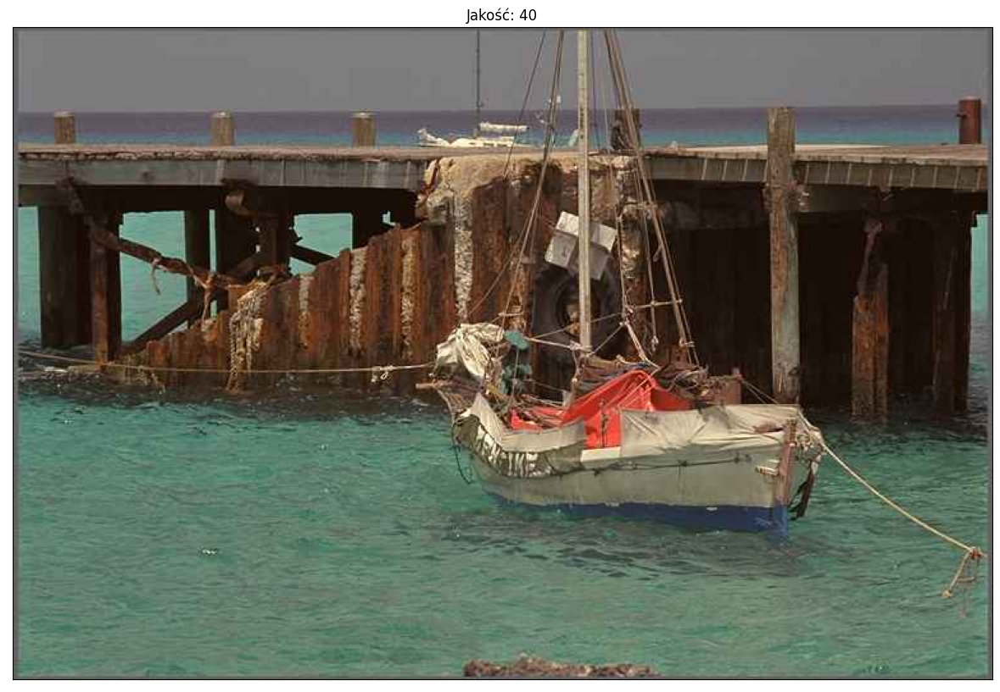

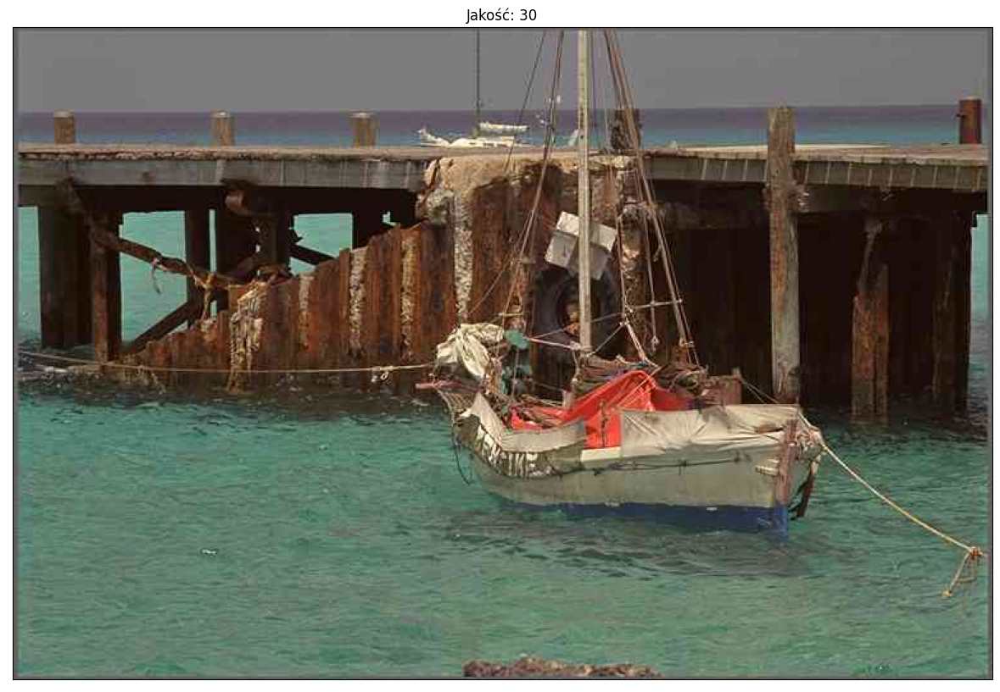

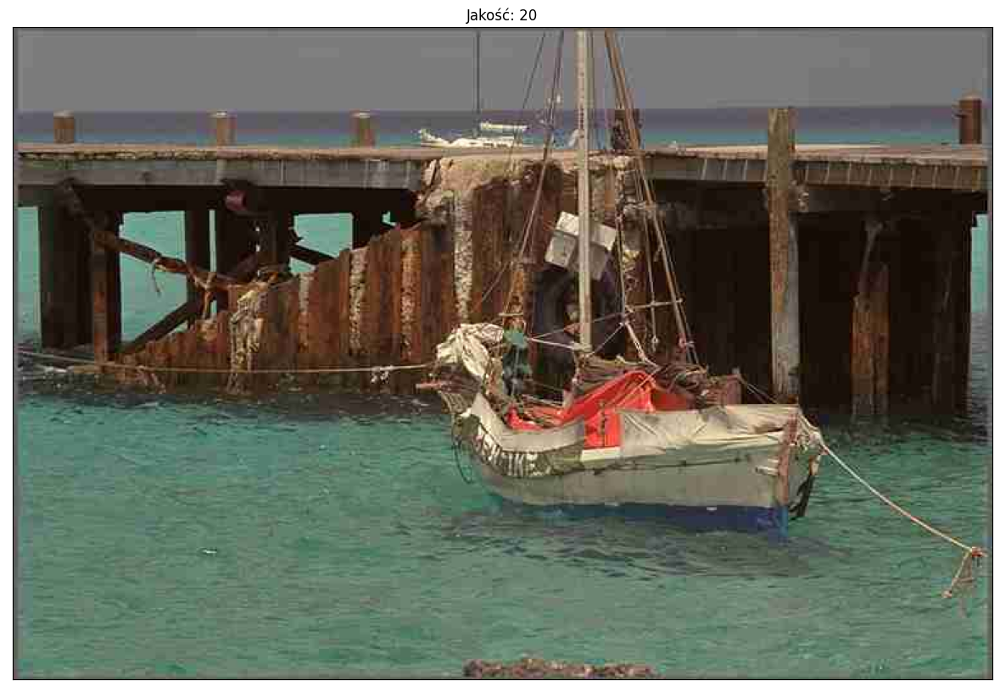

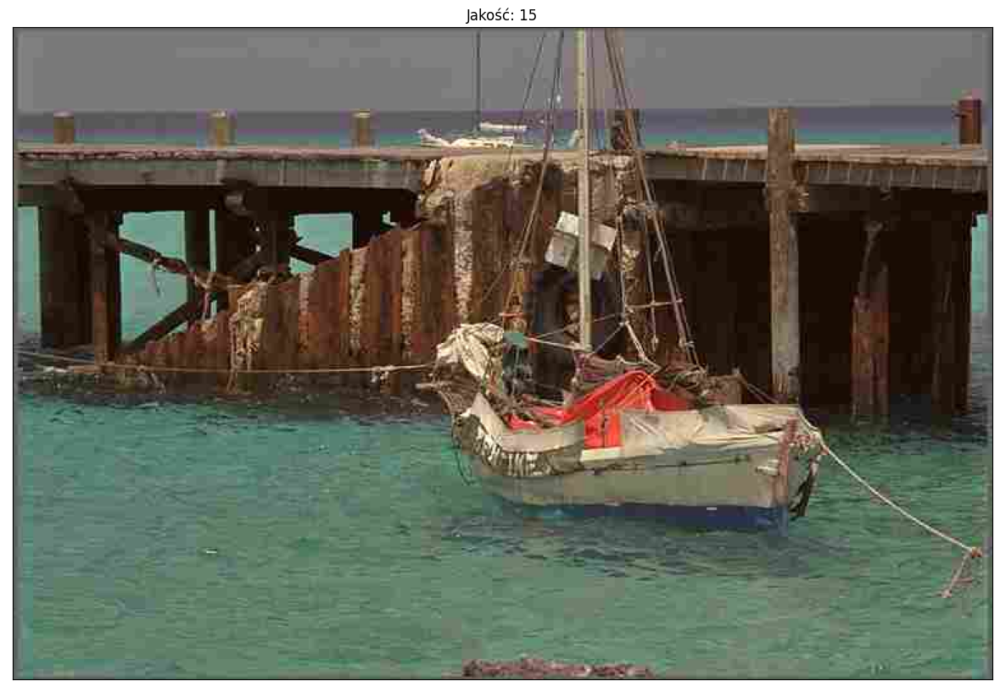

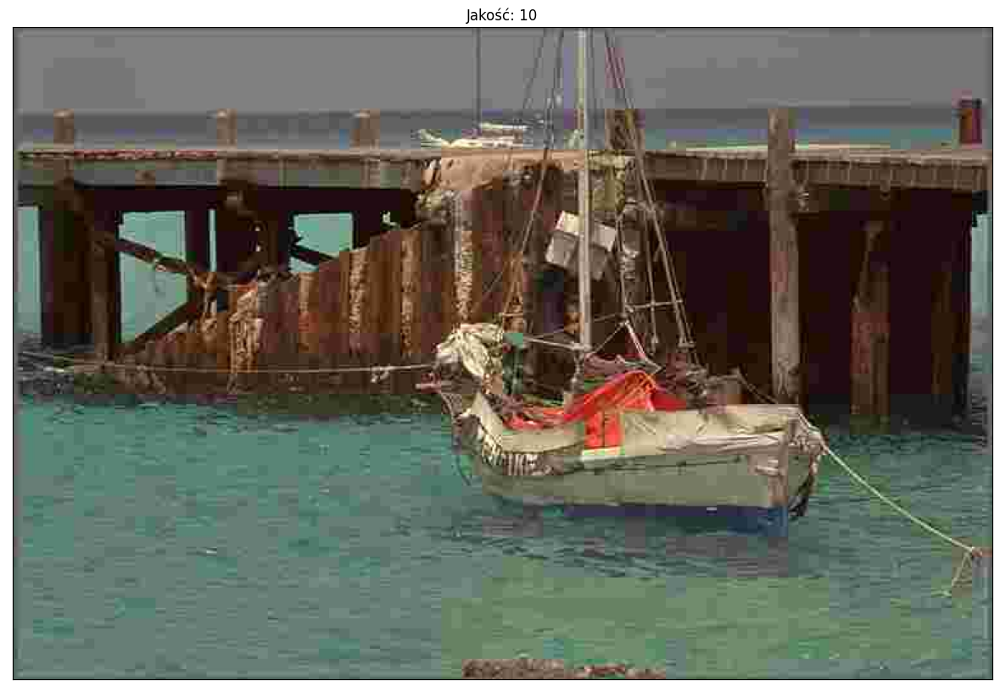

In [14]:

def calc_mse_psnr(img1, img2):

    imax = 255.**2  
    mse = ((img1.astype(np.float64) - img2)**2).sum() / \
        img1.size 
    psnr = 10.0 * np.log10(imax / mse)
    return (mse, psnr)

image = cv2.imread(img_paths["color"], cv2.IMREAD_UNCHANGED)
imshow(image, f"Obraz oryginalny")
xx = [] 
ym = []  
yp = []  

for quality in [90, 80, 70, 60, 50, 40, 30, 20, 15, 10]:
    out_file_name = f"out_image_q{quality:03d}.jpg"
    out_file_path = str(out_dir_root / out_file_name)

    cv2.imwrite(out_file_path, image, (cv2.IMWRITE_JPEG_QUALITY, quality))
    image_compressed = cv2.imread(out_file_path, cv2.IMREAD_UNCHANGED)
    imshow(image_compressed, f"Jakość: {quality}")
    bitrate = 8 * os.stat(out_file_path).st_size / \
        (image.shape[0] * image.shape[1])
    mse, psnr = calc_mse_psnr(image, image_compressed)
    xx.append(bitrate)
    ym.append(mse)
    yp.append(psnr)


### Wykresy miar jakości

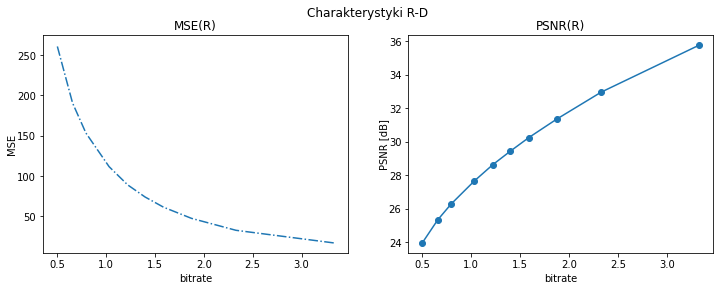

In [54]:
fig = plt.figure()
fig.set_figwidth(fig.get_figwidth() * 2)
plt.suptitle("Charakterystyki R-D")
plt.subplot(1, 2, 1)
plt.plot(xx, ym, "-.")
plt.title("MSE(R)")
plt.xlabel("bitrate")
plt.ylabel("MSE", labelpad=0)
plt.subplot(1, 2, 2)
plt.plot(xx, yp, "-o")
plt.title("PSNR(R)")
plt.xlabel("bitrate")
plt.ylabel("PSNR [dB]", labelpad=0)
plt.show()


### Przepływność bitowa dla kolorowego obrazu w formacie PNG

In [43]:
bitrate = 8 * os.stat(img_paths["color"]).st_size / \
    (image.shape[0] * image.shape[1])
print(f"bitrate: {bitrate:.4f}")

bitrate: 16.4764
